In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

%matplotlib inline

In [3]:
import plotly.io as pio
pio.renderers.default = "notebook"

In [3]:
meteo_price_cleaned = pd.read_csv('../src/data/preprocessed/meteo_da_price_cleaned.csv')
meteo_neso_solar_cleaned = pd.read_csv('../src/data/preprocessed/meteo_neso_solar_cleaned.csv')
meteo_neso_wind_cleaned = pd.read_csv('../src/data/preprocessed/meteo_neso_wind_cleaned.csv')
neso_demand_forecast_cleaned = pd.read_csv('../src/data/preprocessed/neso_demand_forecast_cleaned.csv')

Using plots and graphs to analyize

In [5]:
meteo_price_cleaned.head()

,Timestamp start (Europe/Brussels),Timestamp end (Europe/Brussels),Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh),dtbe,dtutc
0,01/01/2024 00:00,01/01/2024 00:15,45.38,2024-01-01 00:00:00+01:00,2023-12-31 23:00:00+00:00
1,01/01/2024 00:15,01/01/2024 00:30,45.38,2024-01-01 00:15:00+01:00,2023-12-31 23:15:00+00:00
2,01/01/2024 00:30,01/01/2024 00:45,45.38,2024-01-01 00:30:00+01:00,2023-12-31 23:30:00+00:00
3,01/01/2024 00:45,01/01/2024 01:00,45.38,2024-01-01 00:45:00+01:00,2023-12-31 23:45:00+00:00
4,01/01/2024 01:00,01/01/2024 01:15,43.90,2024-01-01 01:00:00+01:00,2024-01-01 00:00:00+00:00


In [11]:
meteo_neso_solar_cleaned.head(150)

,Timestamp start (Europe/Brussels),Timestamp end (Europe/Brussels),solar_fc_p10_meteo_mw,solar_fc_meteo_mw,solar_fc_p90_meteo_mw,solar_fc_neso_mw,solar_installed_capacity_mw,dtbe,dtutc
0,01/01/2024 00:00,01/01/2024 00:15,0.00,0.00,0.00,0.0,15905.0,2024-01-01 00:00:00+01:00,2023-12-31 23:00:00+00:00
1,01/01/2024 00:15,01/01/2024 00:30,0.00,0.00,0.00,0.0,15905.0,2024-01-01 00:15:00+01:00,2023-12-31 23:15:00+00:00
2,01/01/2024 00:30,01/01/2024 00:45,0.00,0.00,0.00,0.0,15905.0,2024-01-01 00:30:00+01:00,2023-12-31 23:30:00+00:00
3,01/01/2024 00:45,01/01/2024 01:00,0.00,0.00,0.00,0.0,15905.0,2024-01-01 00:45:00+01:00,2023-12-31 23:45:00+00:00
4,01/01/2024 01:00,01/01/2024 01:15,0.00,0.00,0.00,0.0,15905.0,2024-01-01 01:00:00+01:00,2024-01-01 00:00:00+00:00
...,...,...,...,...,...,...,...,...,...
145,02/01/2024 12:15,02/01/2024 12:30,192.33,298.99,405.65,759.0,15905.0,2024-01-02 12:15:00+01:00,2024-01-02 11:15:00+00:00
146,02/01/2024 12:30,02/01/2024 12:45,196.36,302.81,409.26,856.0,15905.0,2024-01-02 12:30:00+01:00,2024-01-02 11:30:00+00:00
147,02/01/2024 12:45,02/01/2024 13:00,200.27,308.82,417.37,856.0,15905.0,2024-01-02 12:45:00+01:00,2024-01-02 11:45:00+00:00
148,02/01/2024 13:00,02/01/2024 13:15,206.32,322.77,439.21,899.0,15905.0,2024-01-02 13:00:00+01:00,2024-01-02 12:00:00+00:00


In [8]:
meteo_da_price = pd.read_csv('../data/raw/gb_meteo_da_price_forecast.csv')
meteo_neso_solar = pd.read_csv('../data/raw/gb_meteo_neso_solar_forecast.csv')
meteo_neso_wind = pd.read_csv('../data/raw/gb_meteo_neso_wind_forecast.csv')
neso_demand_forecast = pd.read_csv('../data/raw/gb_neso_demand_forecast.csv')

In [14]:
meteo_price_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38208 entries, 0 to 38207
Data columns (total 5 columns):
 #   Column                                                             Non-Null Count  Dtype  
---  ------                                                             --------------  -----  
 0   Timestamp start (Europe/Brussels)                                  38208 non-null  object 
 1   Timestamp end (Europe/Brussels)                                    38208 non-null  object 
 2   Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)  38208 non-null  float64
 3   dtbe                                                               38208 non-null  object 
 4   dtutc                                                              38208 non-null  object 
dtypes: float64(1), object(4)
memory usage: 1.5+ MB


In [13]:
meteo_neso_solar_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38208 entries, 0 to 38207
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Timestamp start (Europe/Brussels)  38208 non-null  object 
 1   Timestamp end (Europe/Brussels)    38208 non-null  object 
 2   solar_fc_p10_meteo_mw              38208 non-null  float64
 3   solar_fc_meteo_mw                  38208 non-null  float64
 4   solar_fc_p90_meteo_mw              38208 non-null  float64
 5   solar_fc_neso_mw                   38208 non-null  float64
 6   solar_installed_capacity_mw        38208 non-null  float64
 7   dtbe                               38208 non-null  object 
 8   dtutc                              38208 non-null  object 
dtypes: float64(5), object(4)
memory usage: 2.6+ MB


In [20]:
# meteo_price_cleaned = pd.read_csv('../src/data/preprocessed/meteo_da_price_cleaned.csv')

meteo_price_cleaned = meteo_price_cleaned.rename(columns={"Timestamp start (Europe/Brussels)  ": "Timestamp start", "Timestamp end (Europe/Brussels)": "Timestamp end", "Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)":"Price Avg Forecast UK_da"})
print(meteo_price_cleaned.head())

  Timestamp start (Europe/Brussels)     Timestamp end  \
0                  01/01/2024 00:00  01/01/2024 00:15   
1                  01/01/2024 00:15  01/01/2024 00:30   
2                  01/01/2024 00:30  01/01/2024 00:45   
3                  01/01/2024 00:45  01/01/2024 01:00   
4                  01/01/2024 01:00  01/01/2024 01:15   

   Price Avg Forecast UK_da                       dtbe  \
0                     45.38  2024-01-01 00:00:00+01:00   
1                     45.38  2024-01-01 00:15:00+01:00   
2                     45.38  2024-01-01 00:30:00+01:00   
3                     45.38  2024-01-01 00:45:00+01:00   
4                     43.90  2024-01-01 01:00:00+01:00   

                       dtutc  
0  2023-12-31 23:00:00+00:00  
1  2023-12-31 23:15:00+00:00  
2  2023-12-31 23:30:00+00:00  
3  2023-12-31 23:45:00+00:00  
4  2024-01-01 00:00:00+00:00  


In [29]:
meteo_neso_solar_cleaned=meteo_neso_solar_cleaned.rename(columns={"Timestamp start (Europe/Brussels)": "Timestamp start", "Timestamp end (Europe/Brussels)": "Timestamp end"})
print(meteo_neso_solar_cleaned.head())

    Timestamp start     Timestamp end  solar_fc_p10_meteo_mw  \
0  01/01/2024 00:00  01/01/2024 00:15                    0.0   
1  01/01/2024 00:15  01/01/2024 00:30                    0.0   
2  01/01/2024 00:30  01/01/2024 00:45                    0.0   
3  01/01/2024 00:45  01/01/2024 01:00                    0.0   
4  01/01/2024 01:00  01/01/2024 01:15                    0.0   

   solar_fc_meteo_mw  solar_fc_p90_meteo_mw  solar_fc_neso_mw  \
0                0.0                    0.0               0.0   
1                0.0                    0.0               0.0   
2                0.0                    0.0               0.0   
3                0.0                    0.0               0.0   
4                0.0                    0.0               0.0   

   solar_installed_capacity_mw                       dtbe  \
0                      15905.0  2024-01-01 00:00:00+01:00   
1                      15905.0  2024-01-01 00:15:00+01:00   
2                      15905.0  2024-01-0

In [26]:
meteo_neso_wind_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38208 entries, 0 to 38207
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Timestamp start (Europe/Brussels)  38208 non-null  object 
 1   Timestamp end (Europe/Brussels)    38208 non-null  object 
 2   wind_fc_p10_meteo_mw               38208 non-null  float64
 3   wind_fc_meteo_mw                   38208 non-null  float64
 4   wind_fc_p90_meteo_mw               38208 non-null  float64
 5   wind_fc_neso_mw                    38208 non-null  float64
 6   wind_installed_capacity_mw         38208 non-null  float64
 7   dtbe                               38208 non-null  object 
 8   dtutc                              38208 non-null  object 
dtypes: float64(5), object(4)
memory usage: 2.6+ MB


In [30]:
meteo_neso_wind_cleaned = meteo_neso_wind_cleaned.rename(columns={"Timestamp start (Europe/Brussels)": "Timestamp start", "Timestamp end (Europe/Brussels)": "Timestamp end"})
print(meteo_neso_wind_cleaned.head())

    Timestamp start     Timestamp end  wind_fc_p10_meteo_mw  wind_fc_meteo_mw  \
0  01/01/2024 00:00  01/01/2024 00:15               9617.71          10908.56   
1  01/01/2024 00:15  01/01/2024 00:30               9620.47          10939.10   
2  01/01/2024 00:30  01/01/2024 00:45               9623.23          10969.64   
3  01/01/2024 00:45  01/01/2024 01:00               9625.99          11000.17   
4  01/01/2024 01:00  01/01/2024 01:15               9644.60          11048.36   

   wind_fc_p90_meteo_mw  wind_fc_neso_mw  wind_installed_capacity_mw  \
0              12199.41          15599.0                     23076.0   
1              12257.72          15599.0                     23076.0   
2              12316.04          15599.0                     23076.0   
3              12374.36          15599.0                     23076.0   
4              12452.12          15599.0                     23076.0   

                        dtbe                      dtutc  
0  2024-01-01 00:00:00

In [21]:
df = pd.read_csv('../src/data/preprocessed/meteo_neso_solar_cleaned.csv')


In [23]:
print(df['solar_fc_neso_mw'].describe())

count    38208.000000
mean      1398.960061
std       2220.091574
min          0.000000
25%          0.000000
50%          0.000000
75%       2188.500000
max      10082.000000
Name: solar_fc_neso_mw, dtype: float64


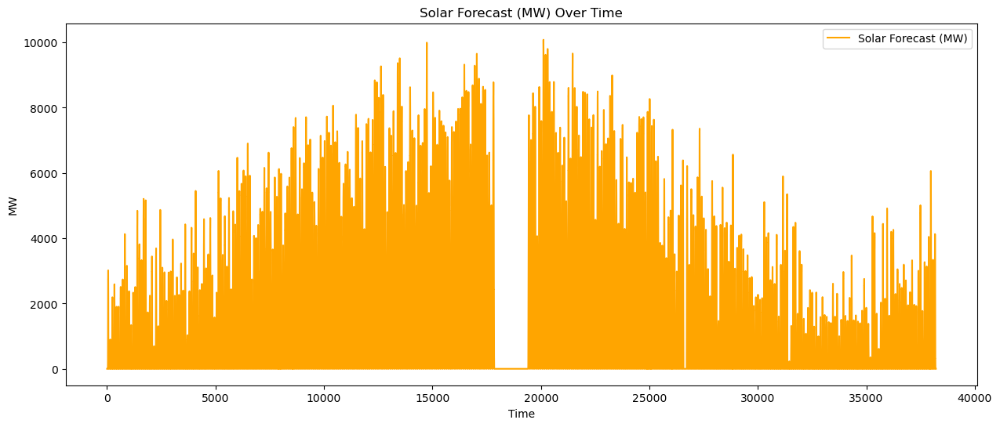

In [24]:
plt.figure(figsize=(15, 6))
plt.plot(df['solar_fc_neso_mw'], label='Solar Forecast (MW)', color='orange')
plt.title('Solar Forecast (MW) Over Time')
plt.xlabel('Time')
plt.ylabel('MW')
plt.legend()
plt.show()


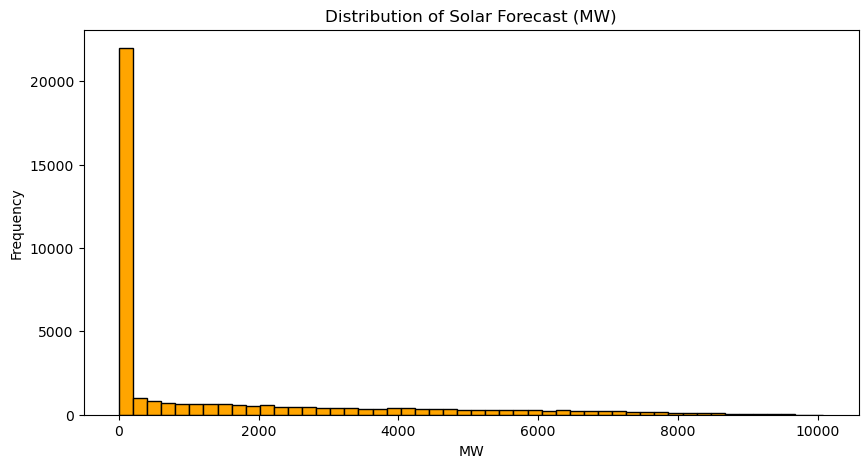

In [25]:
plt.figure(figsize=(10, 5))
plt.hist(df['solar_fc_neso_mw'], bins=50, color='orange', edgecolor='black')
plt.title('Distribution of Solar Forecast (MW)')
plt.xlabel('MW')
plt.ylabel('Frequency')
plt.show()

In [26]:
df_dropped = df.drop(columns=['solar_fc_neso_mw'])


In [27]:
print("Columns after dropping:", df_dropped.columns)


Columns after dropping: Index(['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
       'solar_fc_p10_meteo_mw', 'solar_fc_meteo_mw', 'solar_fc_p90_meteo_mw',
       'solar_installed_capacity_mw', 'dtbe', 'dtutc'],
      dtype='object')


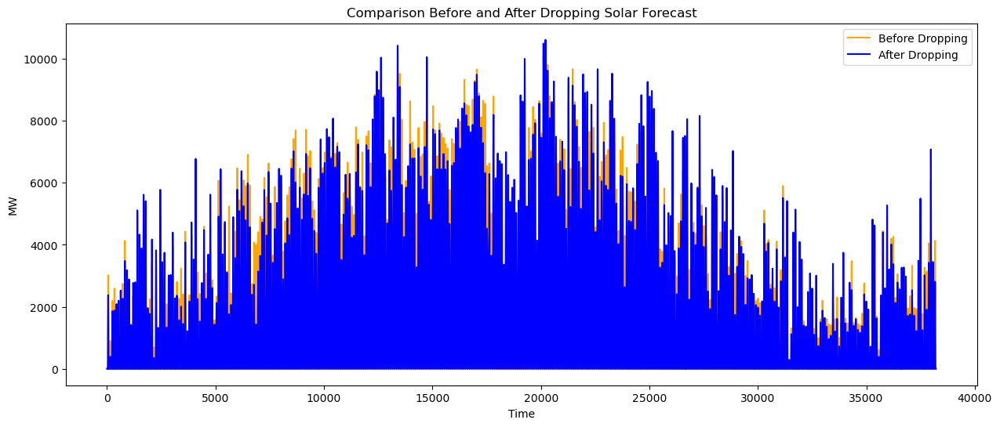

In [35]:
plt.figure(figsize=(15, 6))
plt.plot(df['solar_fc_neso_mw'], label='Before Dropping', color='orange')

if 'solar_fc_meteo_mw' in df_dropped.columns:
    plt.plot(df_dropped['solar_fc_meteo_mw'], label='After Dropping', color='blue')

plt.title('Comparison Before and After Dropping Solar Forecast')
plt.xlabel('Time')
plt.ylabel('MW')
plt.legend()
plt.show()


In [31]:
print(df_dropped.columns)


Index(['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
       'solar_fc_p10_meteo_mw', 'solar_fc_meteo_mw', 'solar_fc_p90_meteo_mw',
       'solar_installed_capacity_mw', 'dtbe', 'dtutc'],
      dtype='object')


In [37]:
print("Columns before dropping:", df.columns)
print("Columns after dropping:", df_dropped.columns)


Columns before dropping: Index(['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
       'solar_fc_p10_meteo_mw', 'solar_fc_meteo_mw', 'solar_fc_p90_meteo_mw',
       'solar_fc_neso_mw', 'solar_installed_capacity_mw', 'dtbe', 'dtutc'],
      dtype='object')
Columns after dropping: Index(['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
       'solar_fc_p10_meteo_mw', 'solar_fc_meteo_mw', 'solar_fc_p90_meteo_mw',
       'solar_installed_capacity_mw', 'dtbe', 'dtutc'],
      dtype='object')


In [42]:
import pandas as pd
import plotly.express as px

file_path = "../src/data/preprocessed/meteo_neso_solar_cleaned.csv"

df = pd.read_csv(file_path)
print(df.columns)  


Index(['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
       'solar_fc_p10_meteo_mw', 'solar_fc_meteo_mw', 'solar_fc_p90_meteo_mw',
       'solar_fc_neso_mw', 'solar_installed_capacity_mw', 'dtbe', 'dtutc'],
      dtype='object')


In [43]:

df['dtutc'] = pd.to_datetime(df['dtutc'])

columns_to_plot = ['solar_fc_p10_meteo_mw', 'solar_fc_meteo_mw', 'solar_fc_p90_meteo_mw', 'solar_installed_capacity_mw']

df_long = df.melt(id_vars=['dtutc'], value_vars=columns_to_plot, var_name='Forecast Type', value_name='MW')

fig = px.line(df_long, x='dtutc', y='MW', color='Forecast Type',
              title='Solar Forecast Over Time', labels={'dtutc': 'Time (UTC)', 'MW': 'Solar Forecast (MW)'})

fig.show()


C:\Users\Martina\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\Martina\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [46]:
df = pd.read_csv('../src/data/preprocessed/meteo_neso_wind_cleaned.csv')
df_dropped = df.drop(columns=['wind_fc_neso_mw'])


In [47]:
print("Columns after dropping:", df_dropped.columns)


Columns after dropping: Index(['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
       'wind_fc_p10_meteo_mw', 'wind_fc_meteo_mw', 'wind_fc_p90_meteo_mw',
       'wind_installed_capacity_mw', 'dtbe', 'dtutc'],
      dtype='object')


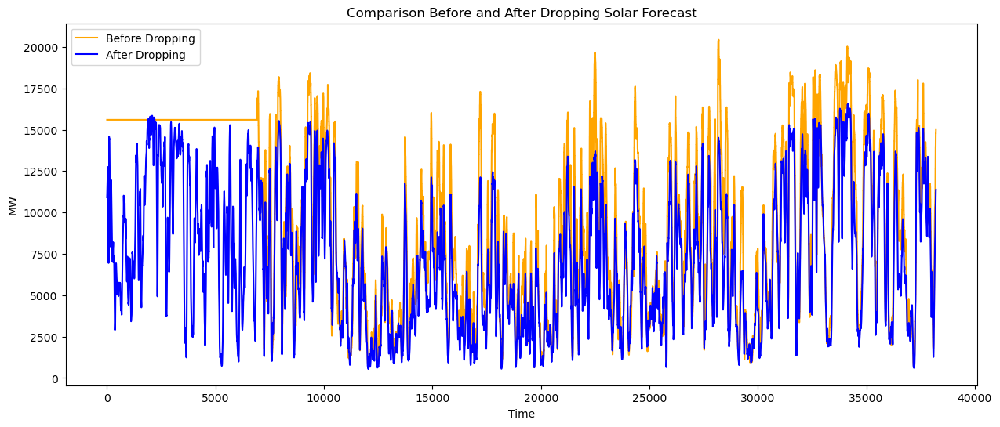

In [52]:
plt.figure(figsize=(15, 6))
plt.plot(df['wind_fc_neso_mw'], label='Before Dropping', color='orange')

if 'wind_fc_meteo_mw' in df_dropped.columns:
    plt.plot(df_dropped['wind_fc_meteo_mw'], label='After Dropping', color='blue')

plt.title('Comparison Before and After Dropping Solar Forecast')
plt.xlabel('Time')
plt.ylabel('MW')
plt.legend()
plt.show()

In [123]:
# df['dtutc'] = pd.to_datetime(df['dtutc'])

# columns_to_plot =['Timestamp start (Europe/Brussels)', 'Timestamp end (Europe/Brussels)',
#        'wind_fc_p10_meteo_mw', 'wind_fc_meteo_mw', 'wind_fc_p90_meteo_mw',
#        'wind_installed_capacity_mw', 'dtbe', 'dtutc']

# df_long = df.melt(id_vars=['dtutc'], value_vars=columns_to_plot, var_name='Forecast Type', value_name='MW')

# fig = px.line(df_long, x='dtutc', y='MW', color='Forecast Type',
#               title='Solar Forecast Over Time', labels={'dtutc': 'Time (UTC)', 'MW': 'Solar Forecast (MW)'})

# fig.show()


In [81]:
import plotly.express as px

df = pd.read_csv('../src/data/processed/processed_data.csv')
df.head()


,dtcet,demand_National Demand Outturn (INDO) - GB (MW),demand_National Demand Forecast (NDF) - GB (MW),price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh),wind_wind_fc_p10_meteo_mw,wind_wind_fc_meteo_mw,wind_wind_fc_p90_meteo_mw,wind_wind_installed_capacity_mw,solar_solar_fc_p10_meteo_mw,solar_solar_fc_meteo_mw,solar_solar_fc_p90_meteo_mw,solar_solar_installed_capacity_mw
0,2024-06-01 00:00:00+02:00,20349.0,20098.0,68.78,6906.9775,8027.880,9148.7775,25583.0,0.0,0.0,0.0,15907.0
1,2024-06-01 01:00:00+02:00,19447.5,19365.0,65.81,6836.5925,7737.840,8639.0825,25583.0,0.0,0.0,0.0,15905.0
2,2024-06-01 02:00:00+02:00,18827.5,18495.5,62.66,6640.8275,7386.300,8131.7700,25583.0,0.0,0.0,0.0,15905.0
3,2024-06-01 03:00:00+02:00,18030.0,18031.0,60.81,6405.5000,7077.050,7748.5950,25583.0,0.0,0.0,0.0,15905.0
4,2024-06-01 04:00:00+02:00,17463.0,17487.5,58.68,6173.2850,6845.355,7517.4250,25583.0,0.0,0.0,0.0,15905.0


In [82]:
df = pd.read_csv('../src/data/processed/reference_days.csv')
df.head()



,date,closest_reference_days,distance
0,2024-07-30,"[Timestamp('2024-07-18 00:00:00'), Timestamp('...",1897.127522
1,2024-07-31,"[Timestamp('2024-06-24 00:00:00'), Timestamp('...",1576.995291
2,2024-08-01,"[Timestamp('2024-06-25 00:00:00'), Timestamp('...",1284.932866
3,2024-08-02,"[Timestamp('2024-07-19 00:00:00'), Timestamp('...",3731.896647
4,2024-08-03,"[Timestamp('2024-06-22 00:00:00'), Timestamp('...",2507.075033


In [87]:
daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')
df.head(150)

,Unnamed: 0,demand_National Demand Forecast (NDF) - GB (MW)_mean,demand_National Demand Forecast (NDF) - GB (MW)_max,demand_National Demand Forecast (NDF) - GB (MW)_min,demand_National Demand Forecast (NDF) - GB (MW)_spread,demand_National Demand Forecast (NDF) - GB (MW)_std,price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_mean,price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_max,price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_min,price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_spread,...,solar_solar_fc_meteo_mw_mean,solar_solar_fc_meteo_mw_max,solar_solar_fc_meteo_mw_min,solar_solar_fc_meteo_mw_spread,solar_solar_fc_meteo_mw_std,wind_wind_fc_meteo_mw_mean,wind_wind_fc_meteo_mw_max,wind_wind_fc_meteo_mw_min,wind_wind_fc_meteo_mw_spread,wind_wind_fc_meteo_mw_std
0,2024-05-31,19731.500000,20098.0,19365.0,733.0,518.309271,67.295000,68.78,65.81,2.97,...,0.000000,0.000,0.00000,0.00000,0.000000,7882.860000,8027.8800,7737.8400,290.0400,205.089251
1,2024-06-01,20013.333333,24200.0,17441.0,6759.0,2029.513449,64.657500,83.92,45.97,37.95,...,2651.866979,7147.370,0.00000,7147.37000,2813.981007,6865.345313,7609.6300,5774.1650,1835.4650,438.523663
2,2024-06-02,18956.500000,24718.5,16060.0,8658.5,2987.569795,59.624583,91.60,32.43,59.17,...,3461.726146,10050.700,0.00000,10050.70000,3859.800303,4634.050104,5685.4875,3983.4600,1702.0275,561.902462
3,2024-06-03,23517.583333,27674.5,16896.0,10778.5,3549.271657,84.425417,104.37,67.21,37.16,...,2005.121771,5263.320,0.00000,5263.32000,2101.019451,4504.541250,4835.4750,4015.9900,819.4850,196.992830
4,2024-06-04,23226.458333,26778.0,18132.0,8646.0,2906.583872,69.423750,84.59,43.89,40.70,...,1813.684792,4733.835,0.00000,4733.83500,1867.413374,9189.498854,12114.3100,4901.7175,7212.5925,2793.762697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,2024-10-23,27763.687500,35832.5,20198.5,15634.0,5078.771597,92.427500,124.50,63.47,61.03,...,1131.739896,4696.015,0.00000,4696.01500,1731.773752,7270.824062,10138.8300,5104.9175,5033.9125,1510.358903
146,2024-10-24,26918.875000,35236.5,18786.0,16450.5,4766.936637,77.522917,115.23,48.29,66.94,...,1407.563229,5758.380,0.00000,5758.38000,2136.511149,9892.186354,11069.1125,5693.2825,5375.8300,1356.910358
147,2024-10-25,28545.375000,34860.5,20628.5,14232.0,4861.923859,103.472083,157.91,83.27,74.64,...,734.864479,2998.510,0.00000,2998.51000,1120.388849,2722.373542,4798.2000,1925.6700,2872.5300,696.531613
148,2024-10-26,24873.083333,31322.5,19698.5,11624.0,3421.649725,90.494583,117.89,74.82,43.07,...,1047.545521,4366.295,0.00000,4366.29500,1613.165636,5275.127604,7694.8700,2771.6250,4923.2450,1760.264695


In [88]:

import plotly.graph_objects as go

feature_groups = {
    'demand': [col for col in daily_metrics.columns if 'demand' in col],
    'price': [col for col in daily_metrics.columns if 'price' in col],
    'wind': [col for col in daily_metrics.columns if 'wind' in col],
    'solar': [col for col in daily_metrics.columns if 'solar' in col]
}

for group, cols in feature_groups.items():
    fig = go.Figure()
    for col in cols:
        fig.add_trace(
            go.Scatter(
                x=daily_metrics.index,
                y=daily_metrics[col],
                mode='lines+markers',
                name=col.replace('_', ' ').title()
            )
        )
    fig.update_layout(
        title=f"{group.title()} Metrics Over Time",
        xaxis_title="Date",
        yaxis_title="Value",
        template="plotly_white",
        height=350,
        width=900
    )
    fig.show()


In [92]:
reference_df = pd.read_csv('../src/data/processed/reference_days.csv')
pd.set_option('display.max_colwidth', None)  
print(reference_df.head())

         date  \
0  2024-07-30   
1  2024-07-31   
2  2024-08-01   
3  2024-08-02   
4  2024-08-03   

                                                                                                                                                       closest_reference_days  \
0  [Timestamp('2024-07-18 00:00:00'), Timestamp('2024-07-17 00:00:00'), Timestamp('2024-06-19 00:00:00'), Timestamp('2024-06-20 00:00:00'), Timestamp('2024-06-25 00:00:00')]   
1  [Timestamp('2024-06-24 00:00:00'), Timestamp('2024-06-19 00:00:00'), Timestamp('2024-06-18 00:00:00'), Timestamp('2024-07-18 00:00:00'), Timestamp('2024-06-20 00:00:00')]   
2  [Timestamp('2024-06-25 00:00:00'), Timestamp('2024-07-31 00:00:00'), Timestamp('2024-07-17 00:00:00'), Timestamp('2024-06-20 00:00:00'), Timestamp('2024-07-30 00:00:00')]   
3  [Timestamp('2024-07-19 00:00:00'), Timestamp('2024-06-21 00:00:00'), Timestamp('2024-07-24 00:00:00'), Timestamp('2024-07-26 00:00:00'), Timestamp('2024-06-26 00:00:00')]   
4  [Timestam

In [99]:
print(df.columns)



Index(['Unnamed: 0', 'demand_National Demand Forecast (NDF) - GB (MW)_mean',
       'demand_National Demand Forecast (NDF) - GB (MW)_max',
       'demand_National Demand Forecast (NDF) - GB (MW)_min',
       'demand_National Demand Forecast (NDF) - GB (MW)_spread',
       'demand_National Demand Forecast (NDF) - GB (MW)_std',
       'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_mean',
       'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_max',
       'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_min',
       'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_spread',
       'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_std',
       'solar_solar_fc_meteo_mw_mean', 'solar_solar_fc_meteo_mw_max',
       'solar_solar_fc_meteo_mw_min', 'solar_solar_fc_meteo_mw_spread',
       'solar_solar_fc_meteo_mw_std', 'wind_wind_fc_meteo_mw_mean',
       'wind_wind_fc_meteo_m

In [97]:
daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')
print(daily_metrics.head())

   Unnamed: 0  demand_National Demand Forecast (NDF) - GB (MW)_mean  \
0  2024-05-31                                          19731.500000   
1  2024-06-01                                          20013.333333   
2  2024-06-02                                          18956.500000   
3  2024-06-03                                          23517.583333   
4  2024-06-04                                          23226.458333   

   demand_National Demand Forecast (NDF) - GB (MW)_max  \
0                                              20098.0   
1                                              24200.0   
2                                              24718.5   
3                                              27674.5   
4                                              26778.0   

   demand_National Demand Forecast (NDF) - GB (MW)_min  \
0                                              19365.0   
1                                              17441.0   
2                                              160

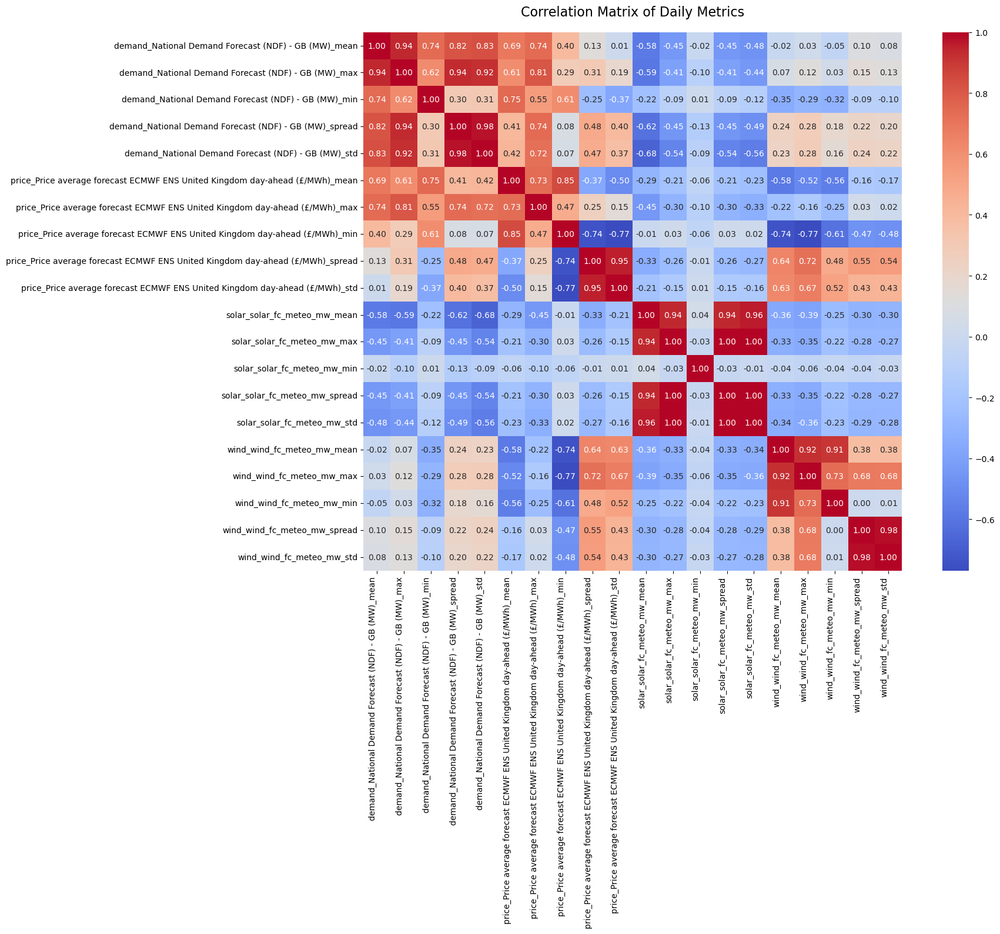

In [120]:
daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')



import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')

daily_metrics_numeric = daily_metrics.loc[:, daily_metrics.columns != 'Unnamed: 0']
plt.figure(figsize=(20, 16))

sns.heatmap(daily_metrics_numeric.corr(), 
            annot=True,          
            cmap='coolwarm',    
            fmt='.2f',          
            square=True)      


plt.xticks(rotation=90, ha='right')
plt.yticks(rotation=0)

plt.title('Correlation Matrix of Daily Metrics', pad=20, size=16)


plt.tight_layout()

plt.show()


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.graph_objects as go
from datetime import timedelta

plt.style.use('seaborn-whitegrid')
sns.set_palette("viridis")
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

time_aware_ref_mapping = pd.read_csv('../src/data/processed/time_aware_reference_mapping.csv')
daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')

if 'Unnamed: 0' in daily_metrics.columns and 'date' not in daily_metrics.columns:
    daily_metrics.rename(columns={'Unnamed: 0': 'date'}, inplace=True)
daily_metrics['date'] = pd.to_datetime(daily_metrics['date'])

time_aware_ref_mapping['delivery_date'] = pd.to_datetime(time_aware_ref_mapping['delivery_date'])
time_aware_ref_mapping['reference_date'] = pd.to_datetime(time_aware_ref_mapping['reference_date'])

print(f"Time-aware reference mapping contains {len(time_aware_ref_mapping)} entries")
time_aware_ref_mapping.head()


Time-aware reference mapping contains 153 entries


C:\Users\Martina\AppData\Local\Temp\ipykernel_32504\552972492.py:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


,delivery_date,reference_date
0,2024-05-31,2024-05-30
1,2024-06-01,2024-05-31
2,2024-06-02,2024-06-01
3,2024-06-03,2024-05-31
4,2024-06-04,2024-06-03


In [5]:
def recreate_clusters_for_date(delivery_date, daily_metrics_df, lookback=60, n_clusters=5):
    
    if not isinstance(delivery_date, pd.Timestamp):
        delivery_date = pd.Timestamp(delivery_date)
        
    start_date = delivery_date - pd.Timedelta(days=lookback)
    historical_data = daily_metrics_df[(daily_metrics_df['date'] >= start_date) & 
                                       (daily_metrics_df['date'] <= delivery_date)].copy()
    
    if historical_data.empty:
        return None
    
    features = [
        'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_mean',
        'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_std',
        'demand_National Demand Forecast (NDF) - GB (MW)_mean',
        'solar_solar_fc_meteo_mw_mean',
        'wind_wind_fc_meteo_mw_mean',
        'is_weekend'
    ]
    
    X = historical_data[features].values
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=45, n_init=10)
    historical_data['cluster'] = kmeans.fit_predict(X_scaled)
    
    return historical_data, X_scaled, kmeans, features

sample_date = time_aware_ref_mapping['delivery_date'].iloc[len(time_aware_ref_mapping)//2]
print(f"Recreating clusters for {sample_date.date()}")

clustered_data, X_scaled, kmeans_model, features = recreate_clusters_for_date(
    sample_date, daily_metrics, n_clusters=5)

print(f"Cluster distribution for {sample_date.date()}:")
print(clustered_data['cluster'].value_counts())


Recreating clusters for 2024-08-15
Cluster distribution for 2024-08-15:
cluster
1    19
2    15
0    11
4    10
3     6
Name: count, dtype: int64


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


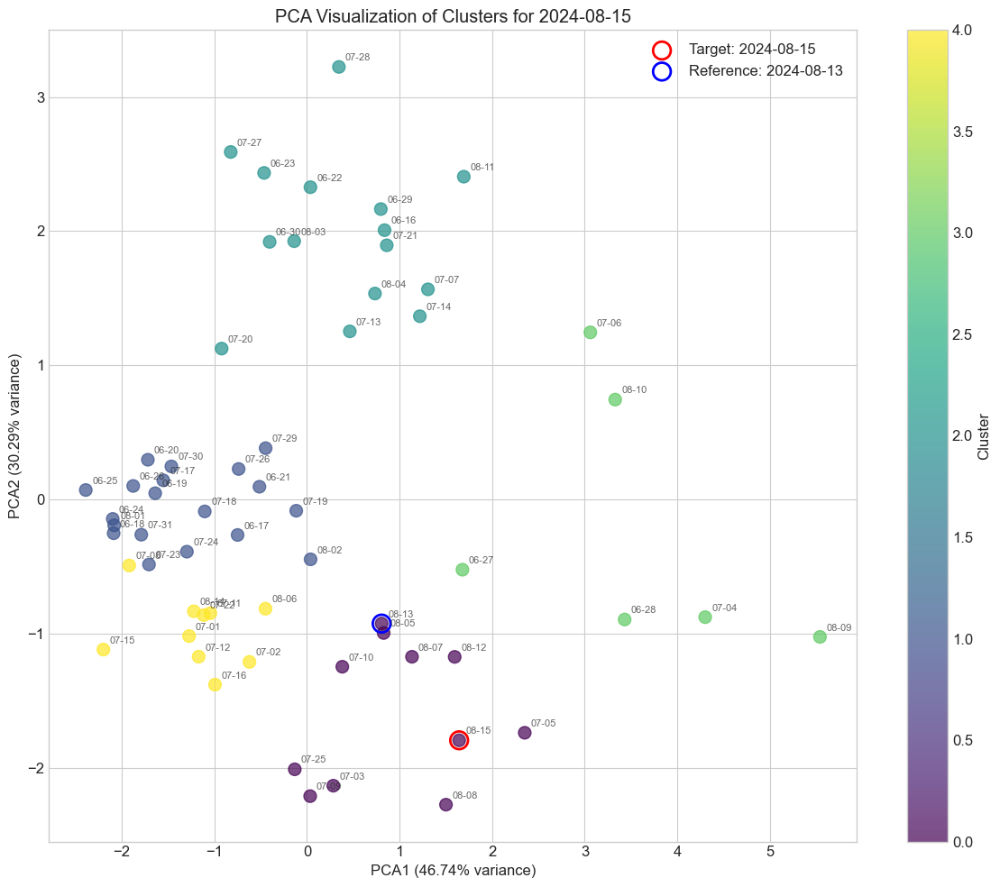

PCA explained variance ratio: [0.46737294 0.30288942]
Total explained variance: 77.03%


In [6]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

clustered_data['pca1'] = pca_result[:, 0]
clustered_data['pca2'] = pca_result[:, 1]

plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    clustered_data['pca1'], 
    clustered_data['pca2'], 
    c=clustered_data['cluster'], 
    cmap='viridis', 
    s=100, 
    alpha=0.7
)

for i, row in clustered_data.iterrows():
    plt.annotate(
        row['date'].strftime('%m-%d'),
        (row['pca1'], row['pca2']),
        fontsize=8,
        alpha=0.7,
        xytext=(5, 5),
        textcoords='offset points'
    )

target_data = clustered_data[clustered_data['date'] == sample_date]
plt.scatter(
    target_data['pca1'], 
    target_data['pca2'], 
    s=200, 
    facecolors='none', 
    edgecolors='red', 
    linewidth=2,
    label=f'Target: {sample_date.strftime("%Y-%m-%d")}'
)

ref_date = time_aware_ref_mapping[time_aware_ref_mapping['delivery_date'] == sample_date]['reference_date'].iloc[0]
ref_data = clustered_data[clustered_data['date'] == ref_date]
if not ref_data.empty:
    plt.scatter(
        ref_data['pca1'], 
        ref_data['pca2'], 
        s=200, 
        facecolors='none', 
        edgecolors='blue', 
        linewidth=2,
        label=f'Reference: {ref_date.strftime("%Y-%m-%d")}'
    )

plt.colorbar(scatter, label='Cluster')
plt.title(f'PCA Visualization of Clusters for {sample_date.strftime("%Y-%m-%d")}')
plt.xlabel(f'PCA1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
plt.ylabel(f'PCA2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"PCA explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Total explained variance: {sum(pca.explained_variance_ratio_):.2%}")


In [32]:
import plotly.express as px



Assigning time-aware clusters to date subset...
Processing date 1/124: 2024-05-31
Processing date 11/124: 2024-06-10
Processing date 21/124: 2024-06-20
Processing date 31/124: 2024-06-30
Date 2024-06-30: found 1 matching rows
Date 2024-07-01: found 1 matching rows
Date 2024-07-02: found 1 matching rows
Date 2024-07-03: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-07-04: found 1 matching rows
Date 2024-07-05: found 1 matching rows
Date 2024-07-06: found 1 matching rows
Date 2024-07-07: found 1 matching rows
Date 2024-07-08: found 1 matching rows
Date 2024-07-09: found 1 matching rows
Processing date 41/124: 2024-07-10


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-07-10: found 1 matching rows
Date 2024-07-11: found 1 matching rows
Date 2024-07-12: found 1 matching rows
Date 2024-07-13: found 1 matching rows
Date 2024-07-14: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-07-15: found 1 matching rows
Date 2024-07-16: found 1 matching rows
Date 2024-07-17: found 1 matching rows
Date 2024-07-18: found 1 matching rows
Date 2024-07-19: found 1 matching rows
Processing date 51/124: 2024-07-20


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-07-20: found 1 matching rows
Date 2024-07-21: found 1 matching rows
Date 2024-07-22: found 1 matching rows
Date 2024-07-23: found 1 matching rows
Date 2024-07-24: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-07-25: found 1 matching rows
Date 2024-07-26: found 1 matching rows
Date 2024-07-27: found 1 matching rows
Date 2024-07-28: found 1 matching rows
Date 2024-07-29: found 1 matching rows
Processing date 61/124: 2024-07-30


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-07-30: found 1 matching rows
Date 2024-07-31: found 1 matching rows
Date 2024-08-01: found 1 matching rows
Date 2024-08-02: found 1 matching rows
Date 2024-08-03: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-08-04: found 1 matching rows
Date 2024-08-05: found 1 matching rows
Date 2024-08-06: found 1 matching rows
Date 2024-08-07: found 1 matching rows
Date 2024-08-08: found 1 matching rows
Processing date 71/124: 2024-08-09


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-08-09: found 1 matching rows
Date 2024-08-10: found 1 matching rows
Date 2024-08-11: found 1 matching rows
Date 2024-08-12: found 1 matching rows
Date 2024-08-13: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-08-14: found 1 matching rows
Date 2024-08-15: found 1 matching rows
Date 2024-08-16: found 1 matching rows
Date 2024-08-17: found 1 matching rows
Date 2024-08-18: found 1 matching rows
Processing date 81/124: 2024-08-19
Date 2024-08-19: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-08-20: found 1 matching rows
Date 2024-08-21: found 1 matching rows
Date 2024-08-22: found 1 matching rows
Date 2024-08-23: found 1 matching rows
Date 2024-08-24: found 1 matching rows
Date 2024-08-25: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-08-26: found 1 matching rows
Date 2024-08-27: found 1 matching rows
Date 2024-08-28: found 1 matching rows
Processing date 91/124: 2024-08-29
Date 2024-08-29: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-08-30: found 1 matching rows
Date 2024-08-31: found 1 matching rows
Date 2024-09-01: found 1 matching rows
Date 2024-09-02: found 1 matching rows
Date 2024-09-03: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-09-04: found 1 matching rows
Date 2024-09-05: found 1 matching rows
Date 2024-09-06: found 1 matching rows
Date 2024-09-07: found 1 matching rows
Processing date 101/124: 2024-09-08
Date 2024-09-08: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-09-09: found 1 matching rows
Date 2024-09-10: found 1 matching rows
Date 2024-09-11: found 1 matching rows
Date 2024-09-12: found 1 matching rows
Date 2024-09-13: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-09-14: found 1 matching rows
Date 2024-09-15: found 1 matching rows
Date 2024-09-16: found 1 matching rows
Date 2024-09-17: found 1 matching rows
Processing date 111/124: 2024-09-18
Date 2024-09-18: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-09-19: found 1 matching rows
Date 2024-09-20: found 1 matching rows
Date 2024-09-21: found 1 matching rows
Date 2024-09-22: found 1 matching rows
Date 2024-09-23: found 1 matching rows


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-09-24: found 1 matching rows
Date 2024-09-25: found 1 matching rows
Date 2024-09-26: found 1 matching rows
Date 2024-09-27: found 1 matching rows
Processing date 121/124: 2024-09-28


C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chun

Date 2024-09-28: found 1 matching rows
Date 2024-09-29: found 1 matching rows
Date 2024-09-30: found 1 matching rows
Date 2024-10-01: found 1 matching rows
Shape of time_aware_clustered: (94, 29)
Is DataFrame empty? False
First few rows:
         date  demand_National Demand Forecast (NDF) - GB (MW)_mean  \
30 2024-06-30                                       20665.833333      
31 2024-07-01                                       23451.125000      
32 2024-07-02                                       24029.833333      
33 2024-07-03                                       23854.750000      
34 2024-07-04                                       20478.750000      

    demand_National Demand Forecast (NDF) - GB (MW)_max  \
30                                            25658.5     
31                                            27500.0     
32                                            28201.0     
33                                            27756.0     
34                                      

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\Martina\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



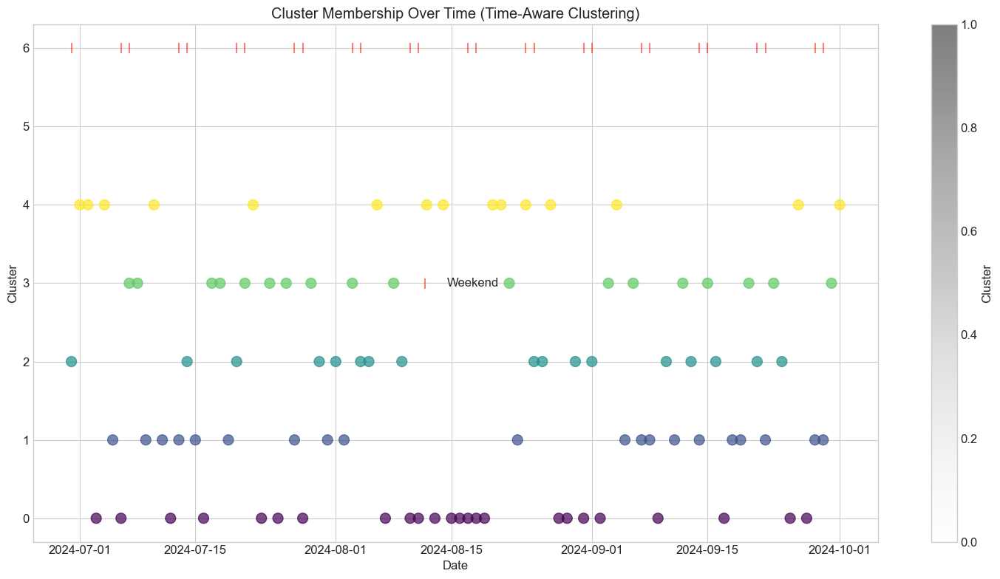

In [21]:
import os
os.environ["OMP_NUM_THREADS"] = "1"

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from datetime import timedelta

def recreate_clusters_for_date(delivery_date, daily_metrics_df, lookback=60, n_clusters=5):
    
    if not isinstance(delivery_date, pd.Timestamp):
        delivery_date = pd.Timestamp(delivery_date)
        
    start_date = delivery_date - pd.Timedelta(days=lookback)
    historical_data = daily_metrics_df[(daily_metrics_df['date'] >= start_date) & 
                                       (daily_metrics_df['date'] <= delivery_date)].copy()
    
    if historical_data.empty:
        return None, None, None, None
    
    features = [
        'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_mean',
        'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_std',
        'demand_National Demand Forecast (NDF) - GB (MW)_mean',
        'solar_solar_fc_meteo_mw_mean',
        'wind_wind_fc_meteo_mw_mean',
        'is_weekend'
    ]
    
    X = historical_data[features].values
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    n_samples = len(historical_data)
    if n_samples < n_clusters:
        n_clusters = max(1, n_samples - 1)
    
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=45, n_init=10)
    historical_data['cluster'] = kmeans.fit_predict(X_scaled)
    
    return historical_data, X_scaled, kmeans, features

def assign_time_aware_clusters(daily_metrics_df, lookback=60):
 
    dates = daily_metrics_df['date'].sort_values().unique()
    result_df = pd.DataFrame()
    
    for i, date in enumerate(dates):
        if i % 10 == 0:  
            print(f"Processing date {i+1}/{len(dates)}: {date.date()}")
            
        if i < lookback:
            continue
            
        historical_data, _, kmeans, _ = recreate_clusters_for_date(
            date, daily_metrics_df, lookback=lookback, n_clusters=min(5, max(1, i//3)))
        
        if historical_data is not None:
            current_date_data = historical_data[historical_data['date'] == date].copy()
            if not current_date_data.empty:
                print(f"Date {date.date()}: found {len(current_date_data)} matching rows")
                result_df = pd.concat([result_df, current_date_data])
    
    return result_df

daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')
if 'Unnamed: 0' in daily_metrics.columns and 'date' not in daily_metrics.columns:
    daily_metrics.rename(columns={'Unnamed: 0': 'date'}, inplace=True)
daily_metrics['date'] = pd.to_datetime(daily_metrics['date'])

date_subset = daily_metrics[(daily_metrics['date'] >= '2024-05-01') & 
                            (daily_metrics['date'] <= '2024-10-01')]

print("Assigning time-aware clusters to date subset...")
time_aware_clustered = assign_time_aware_clusters(date_subset, lookback=30)

print("Shape of time_aware_clustered:", time_aware_clustered.shape)
print("Is DataFrame empty?", time_aware_clustered.empty)
print("First few rows:")
print(time_aware_clustered.head())

print("Date range in subset:", date_subset['date'].min(), "to", date_subset['date'].max())
print("Number of unique dates:", date_subset['date'].nunique())

if not time_aware_clustered.empty:
    plt.figure(figsize=(15, 8))
    plt.scatter(
        time_aware_clustered['date'], 
        time_aware_clustered['cluster'], 
        c=time_aware_clustered['cluster'],
        cmap='viridis',
        s=100, 
        alpha=0.7
    )
    
    if 'is_weekend' in time_aware_clustered.columns:
        weekend_data = time_aware_clustered[time_aware_clustered['is_weekend'] == 1]
        if not weekend_data.empty:
            plt.scatter(
                weekend_data['date'],
                [6] * len(weekend_data),  
                marker='|',
                s=100,
                c='red',
                alpha=0.5,
                label='Weekend'
            )
    
    plt.colorbar(label='Cluster')
    plt.title('Cluster Membership Over Time (Time-Aware Clustering)')
    plt.xlabel('Date')
    plt.ylabel('Cluster')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
else:
    print("Warning: No data available for visualization. The time_aware_clustered DataFrame is empty.")


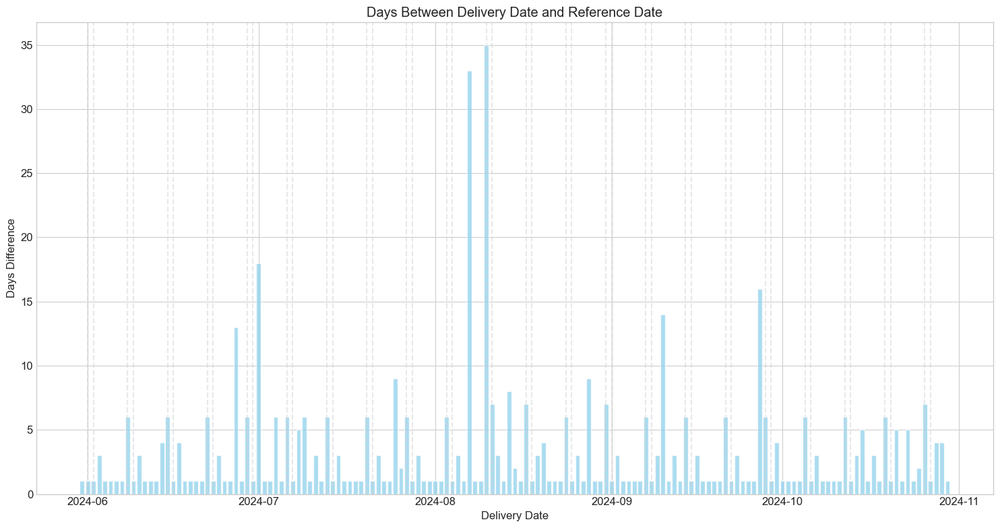

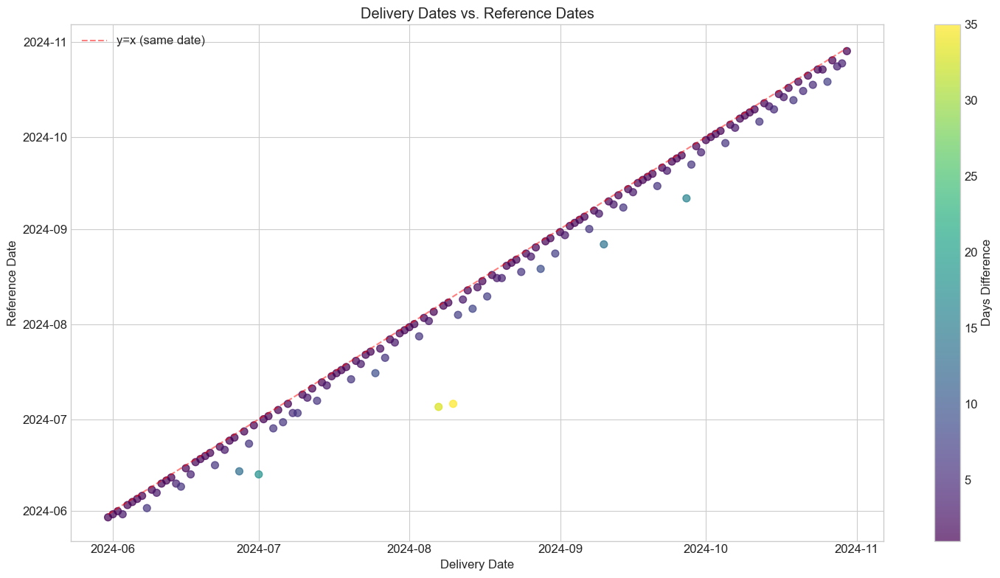

In [11]:
time_aware_ref_mapping['days_difference'] = (
    time_aware_ref_mapping['delivery_date'] - time_aware_ref_mapping['reference_date']
).dt.days

plt.figure(figsize=(15, 8))

plt.bar(
    time_aware_ref_mapping['delivery_date'], 
    time_aware_ref_mapping['days_difference'],
    alpha=0.7,
    color='skyblue'
)

weekend_dates = daily_metrics[daily_metrics['is_weekend'] == 1]['date']
for date in weekend_dates:
    plt.axvline(x=date, color='lightgray', linestyle='--', alpha=0.5)

plt.title('Days Between Delivery Date and Reference Date')
plt.xlabel('Delivery Date')
plt.ylabel('Days Difference')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 8))

scatter = plt.scatter(
    time_aware_ref_mapping['delivery_date'],
    time_aware_ref_mapping['reference_date'],
    c=time_aware_ref_mapping['days_difference'],
    cmap='viridis',
    s=50,
    alpha=0.7
)

plt.plot(
    [time_aware_ref_mapping['delivery_date'].min(), time_aware_ref_mapping['delivery_date'].max()],
    [time_aware_ref_mapping['delivery_date'].min(), time_aware_ref_mapping['delivery_date'].max()],
    'r--',
    alpha=0.5,
    label='y=x (same date)'
)

plt.colorbar(scatter, label='Days Difference')
plt.title('Delivery Dates vs. Reference Dates')
plt.xlabel('Delivery Date')
plt.ylabel('Reference Date')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


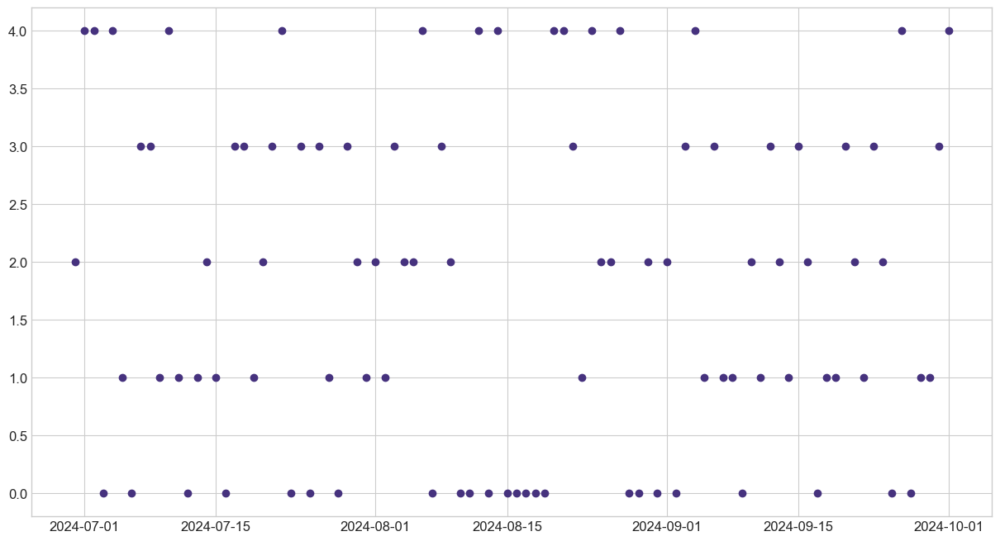

In [28]:
import os
os.environ["OMP_NUM_THREADS"] = "1"
if time_aware_clustered.empty:
    print("Warning: No data available for visualization. Please check the clustering process.")
else:
    plt.figure(figsize=(15, 8))
    plt.scatter(
        time_aware_clustered['date'], 
        time_aware_clustered['cluster'],

    )


In [29]:
daily_metrics = pd.read_csv('../src/data/processed/daily_metrics.csv')
if 'Unnamed: 0' in daily_metrics.columns and 'date' not in daily_metrics.columns:
    daily_metrics.rename(columns={'Unnamed: 0': 'date'}, inplace=True)
daily_metrics['date'] = pd.to_datetime(daily_metrics['date'])

time_aware_ref_mapping = pd.read_csv('../src/data/processed/time_aware_reference_mapping.csv')
time_aware_ref_mapping['delivery_date'] = pd.to_datetime(time_aware_ref_mapping['delivery_date'])
time_aware_ref_mapping['reference_date'] = pd.to_datetime(time_aware_ref_mapping['reference_date'])


clustered_data = pd.read_csv('../src/data/processed/daily_metrics_with_clusters_sklearn.csv')
clustered_data['date'] = pd.to_datetime(clustered_data['date'])

features = [
    'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_mean',
    'price_Price average forecast ECMWF ENS United Kingdom day-ahead (£/MWh)_std',
    'demand_National Demand Forecast (NDF) - GB (MW)_mean',
    'solar_solar_fc_meteo_mw_mean',
    'wind_wind_fc_meteo_mw_mean',
    'is_weekend'
]
from sklearn.preprocessing import StandardScaler
X = clustered_data[features].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

create_date_selector(clustered_data, time_aware_ref_mapping, X_scaled)


Dropdown(description='Select Date:', layout=Layout(width='50%'), options=(('2024-05-31', Timestamp('2024-05-31…

In [25]:
pip install ipywidgets plotly pandas scikit-learn


Note: you may need to restart the kernel to use updated packages.
